In [61]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt
import statsmodels.api as sm


Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)



- Re-calculate z-score data with only samples used.
- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Check onset NAcc and AIns for typo.

# Homemade functions

In [62]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [63]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Calculate coordinates for plotting. 
    NAcc_x_coord = np.mean(dataset_df[NAcc_label].max() + np.abs(dataset_df[NAcc_label].min())) * -0.15
    AIns_x_coord = np.mean(dataset_df[AIns_label].max() + np.abs(dataset_df[AIns_label].min())) * -0.15
    MPFC_x_coord = np.mean(dataset_df[MPFC_label].max() + np.abs(dataset_df[MPFC_label].min())) * -0.15

    PA_y_coord = (dataset_df["Pos_arousal_scaled"].max() - dataset_df["Pos_arousal_scaled"].min()) * -0.35 
    NA_y_coord = (dataset_df["Neg_arousal_scaled"].max() - dataset_df["Neg_arousal_scaled"].min()) * -0.4 
    W_y_coord = (dataset_df["W_score_scaled"].max() - dataset_df["W_score_scaled"].min()) * -0.45

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=PA_y_coord-0.1, fontsize=12,  weight='bold')
    whole_both_trailers_plot.axes[0, 0].set_ylabel('Positive arousal', fontsize = 12, weight='bold')

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 0].set_ylabel('Negative arousal', fontsize = 12, weight='bold')

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].set_xlabel('NAcc ' + type, fontsize = 12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].set_ylabel('Watch scores', fontsize = 12, weight='bold')

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=AIns_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=PA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=AIns_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=AIns_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 1].set_xlabel('AIns ' + type, fontsize = 12, weight='bold')

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=PA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 2].set_xlabel('MPFC ' + type, fontsize = 12, weight='bold')


    # Path to save the plot.
    save_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/Figures/IndividualChoice/Correlations_" + type 
    whole_both_trailers_plot.savefig(save_path + ".png", dpi=300, bbox_inches="tight")



In [64]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [65]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [66]:
def compute_and_plot_corrs(dataframe, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    #Compute PA correlations
    NAcc_PA_corr = pearsonr(dataframe[NAcc_key], dataframe[PA_key])
    AIns_PA_corr = pearsonr(dataframe[AIns_key], dataframe[PA_key])
    MPFC_PA_corr = pearsonr(dataframe[MPFC_key], dataframe[PA_key])

    #Compute NA correlations
    NAcc_NA_corr = pearsonr(dataframe[NAcc_key], dataframe[NA_key])
    AIns_NA_corr = pearsonr(dataframe[AIns_key], dataframe[NA_key])
    MPFC_NA_corr = pearsonr(dataframe[MPFC_key], dataframe[NA_key])

    #Compute W correlations
    NAcc_W_corr = pearsonr(dataframe[NAcc_key], dataframe[W_key])
    AIns_W_corr = pearsonr(dataframe[AIns_key], dataframe[W_key])
    MPFC_W_corr = pearsonr(dataframe[MPFC_key], dataframe[W_key])

    #Create a list with all the correlations
    corrs = [NAcc_PA_corr, NAcc_NA_corr, NAcc_W_corr, AIns_PA_corr, AIns_NA_corr, AIns_W_corr, MPFC_PA_corr, MPFC_NA_corr, MPFC_W_corr]

    # Print the correlations results.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal is: " + str(round(NAcc_PA_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal is: " + str(round(AIns_PA_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal is: " + str(round(MPFC_PA_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal is: " + str(round(NAcc_NA_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal is: " + str(round(AIns_NA_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal is: " + str(round(MPFC_NA_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores is: " + str(round(NAcc_W_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores is: " + str(round(AIns_W_corr[0], 5)) + " with a p-value of: " + str((AIns_W_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores is: " + str(round(MPFC_W_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_corr[1])))

    plot_correlations(dataframe, corrs, signal, title)

In [67]:
def compute_and_plot_both_corrs(dataframe_main, dataframe_C, dataframe_H, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    # Compute PA correlations for Comedy trailers.
    NAcc_PA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[PA_key])
    AIns_PA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[PA_key])
    MPFC_PA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[PA_key])

    # Compute PA correlations for Horror trailers.
    NAcc_PA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[PA_key])
    AIns_PA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[PA_key])
    MPFC_PA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[PA_key])

    # Compute NA correlations for Comedy trailers.
    NAcc_NA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[NA_key])
    AIns_NA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[NA_key])
    MPFC_NA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[NA_key])

    # Compute NA correlations for Horror trailers.
    NAcc_NA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[NA_key])
    AIns_NA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[NA_key])
    MPFC_NA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[NA_key])

    # Compute W correlations for Comedy trailers.
    NAcc_W_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[W_key])
    AIns_W_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[W_key])
    MPFC_W_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[W_key])

    # Compute W correlations for Horror trailers.
    NAcc_W_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[W_key])
    AIns_W_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[W_key])
    MPFC_W_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[W_key])

    # Create a list with all the correlations for Comedy trailers.
    corrs_comedy = [NAcc_PA_comedy_corr, NAcc_NA_comedy_corr, NAcc_W_comedy_corr, AIns_PA_comedy_corr, AIns_NA_comedy_corr, AIns_W_comedy_corr, MPFC_PA_comedy_corr, MPFC_NA_comedy_corr, MPFC_W_comedy_corr]

    # Create a list with all the correlations for Horror trailers.
    corrs_horror = [NAcc_PA_horror_corr, NAcc_NA_horror_corr, NAcc_W_horror_corr, AIns_PA_horror_corr, AIns_NA_horror_corr, AIns_W_horror_corr, MPFC_PA_horror_corr, MPFC_NA_horror_corr, MPFC_W_horror_corr]
    
    # Print the correlations results for Comedy trailers.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal for Comedy trailers is: " + str(round(NAcc_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Comedy trailers is: " + str(round(AIns_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Comedy trailers is: " + str(round(MPFC_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Comedy trailers is: " + str(round(NAcc_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Comedy trailers is: " + str(round(AIns_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Comedy trailers is: " + str(round(MPFC_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Comedy trailers is: " + str(round(NAcc_W_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Comedy trailers is: " + str(round(AIns_W_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_W_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Comedy trailers is: " + str(round(MPFC_W_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_comedy_corr[1])))

    # Print the correlations results for Horror trailers.
    print("\n\nThe correlation between " + str(NAcc_key) + " activation and positive arousal for Horror trailers is: " + str(round(NAcc_PA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Horror trailers is: " + str(round(AIns_PA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Horror trailers is: " + str(round(MPFC_PA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Horror trailers is: " + str(round(NAcc_NA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Horror trailers is: " + str(round(AIns_NA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Horror trailers is: " + str(round(MPFC_NA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Horror trailers is: " + str(round(NAcc_W_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Horror trailers is: " + str(round(AIns_W_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_W_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Horror trailers is: " + str(round(MPFC_W_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_horror_corr[1])))

    # Plot the correlations for both types of trailers.
    plot_correlations3_bothTrailers(dataframe_main, signal, corrs_comedy, corrs_horror, title)

# Clean data

In [68]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [69]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_ISC_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralISC.csv')

# Drop the first columns of the dataframe (repeated). 
ISC_cols = ['NAcc_ISC', 'AIns_ISC', 'MPFC_ISC', 'NAcc_MPFC',
       'AIns_MPFC', 'NAcc_AIns', 'NAcc_MPFC_ISFC', 'AIns_MPFC_ISFC',
       'NAcc_AIns_ISFC', 'AIns_NAcc_ISFC', 'MPFC_NAcc_ISFC', 'MPFC_AIns_ISFC']
all_subs_ISC_df = all_subs_ISC_df[ISC_cols] 

all_subs_events_df = pd.concat([all_subs_events_df, all_subs_ISC_df], axis=1)

print("The un-cleaned shape of the dataframe is: ", all_subs_events_df.shape)
all_subs_events_df.head()
#print(all_subs_events_df.columns[:60])

The un-cleaned shape of the dataframe is:  (899, 113)


,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_ISC,NAcc_MPFC,AIns_MPFC,NAcc_AIns,NAcc_MPFC_ISFC,AIns_MPFC_ISFC,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.293548,1.669757,2.045889,2.114697,0.384533,0.304657,0.145357,0.171728,0.087301,-0.028998
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,0.213385,0.793116,0.896524,1.054257,0.307038,0.231042,-0.033299,0.089549,-0.049391,0.048956
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.141044,...,-0.086120,1.132684,1.103268,1.542749,-0.281199,-0.080390,0.078434,0.049326,-0.025611,0.098562
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.089424,0.350284,0.685057,0.456665,-0.147725,-0.200260,0.102559,-0.111868,-0.055374,0.068627
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,0.072937,0.513060,0.859149,0.624052,-0.563548,0.091703,-0.351483,0.553435,0.454589,0.149986


In [70]:
all_subs_events_df

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_ISC,NAcc_MPFC,AIns_MPFC,NAcc_AIns,NAcc_MPFC_ISFC,AIns_MPFC_ISFC,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.293548,1.669757,2.045889,2.114697,0.384533,0.304657,0.145357,0.171728,0.087301,-0.028998
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,0.213385,0.793116,0.896524,1.054257,0.307038,0.231042,-0.033299,0.089549,-0.049391,0.048956
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.141044,...,-0.086120,1.132684,1.103268,1.542749,-0.281199,-0.080390,0.078434,0.049326,-0.025611,0.098562
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.089424,0.350284,0.685057,0.456665,-0.147725,-0.200260,0.102559,-0.111868,-0.055374,0.068627
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,0.072937,0.513060,0.859149,0.624052,-0.563548,0.091703,-0.351483,0.553435,0.454589,0.149986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
894,sub-37,rh8,Horror,520.0,550.0,30,1,2,1,0.118195,...,-0.075542,0.766773,0.256154,0.559436,0.001412,0.122148,-0.034113,0.186116,-0.191635,-0.519911
895,sub-37,rc10,Comedy,568.0,598.0,30,3,3,3,-0.112056,...,-0.281658,0.589923,0.131098,0.991064,0.020975,0.156914,0.258007,0.118149,0.321024,0.203708
896,sub-37,uh3,Horror,616.0,646.0,30,1,1,1,-0.116483,...,0.383345,0.680065,0.703339,0.374888,-0.161493,0.617480,0.430399,0.230271,0.375080,0.339669
897,sub-37,rc7,Comedy,660.0,690.0,30,2,2,3,0.036835,...,-0.491489,0.395454,0.943146,0.482985,-0.226435,-0.423887,-0.190712,-0.285216,-0.330408,-0.597430


In [71]:
# Calculate Cook's distance for each observation.

all_cooks_df = pd.DataFrame()
participants_list = all_subs_events_df['Participant'].unique()

for sub_id in participants_list: 

    print("Calculating cooks distance for subject: ", sub_id)

    # Get dataframe of current subject.
    current_sub_df = all_subs_events_df[all_subs_events_df['Participant'] == sub_id]
    current_sub_cooks_df = pd.DataFrame()

    # Define response variable.
    Y = current_sub_df['W_score_scaled']

    # Define explanatory variables for each model.
    X_whole = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_whole', 'AIns_whole', 'MPFC_whole']]
    X_onset = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_onset', 'AIns_onset', 'MPFC_onset']]
    X_middle = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_middle', 'AIns_middle', 'MPFC_middle']]
    X_offset = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_offset', 'AIns_offset', 'MPFC_offset']]
    X_ISC = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC']]

    # Add constant to predictor variables.
    X_whole = sm.add_constant(X_whole)
    X_onset = sm.add_constant(X_onset)
    X_middle = sm.add_constant(X_middle)
    X_offset = sm.add_constant(X_offset)
    X_ISC = sm.add_constant(X_ISC)

    # Fit linear regression models
    model_whole = sm.OLS(Y.astype(float), X_whole.astype(float)).fit()
    model_onset = sm.OLS(Y.astype(float), X_onset.astype(float)).fit()
    model_middle = sm.OLS(Y.astype(float), X_middle.astype(float)).fit()
    model_offset = sm.OLS(Y.astype(float), X_offset.astype(float)).fit()
    model_ISC = sm.OLS(Y.astype(float), X_ISC.astype(float)).fit()

    # Create instance of influence for each model.
    influence_whole = model_whole.get_influence()
    influence_onset = model_onset.get_influence()
    influence_middle = model_middle.get_influence()
    influence_offset = model_offset.get_influence()
    influence_ISC = model_ISC.get_influence()

    # Obtain Cook's distance for each observation in each model.
    whole_cooks_scores = influence_whole.cooks_distance
    onset_cooks_scores = influence_onset.cooks_distance
    middle_cooks_scores = influence_middle.cooks_distance
    offset_cooks_scores = influence_offset.cooks_distance
    ISC_cooks_scores = influence_ISC.cooks_distance

    # Add Cook's distance to the dataframe.
    current_sub_cooks_df["Participant"] = current_sub_df["Participant"]
    current_sub_cooks_df["Whole_cooks"] = whole_cooks_scores[0]
    current_sub_cooks_df["Onset_cooks"] = onset_cooks_scores[0]
    current_sub_cooks_df["Middle_cooks"] = middle_cooks_scores[0]
    current_sub_cooks_df["Offset_cooks"] = offset_cooks_scores[0]
    current_sub_cooks_df["ISC_cooks"] = ISC_cooks_scores[0]

    # Append the current subject's Cook's distance to the main dataframe.
    all_cooks_df = pd.concat([all_cooks_df, current_sub_cooks_df], ignore_index=True)

    del current_sub_cooks_df

print("The shape of the Cook's distance dataframe is: ", all_cooks_df.shape)

Calculating cooks distance for subject:  sub-01
Calculating cooks distance for subject:  sub-02
Calculating cooks distance for subject:  sub-03
Calculating cooks distance for subject:  sub-04
Calculating cooks distance for subject:  sub-07
Calculating cooks distance for subject:  sub-08
Calculating cooks distance for subject:  sub-09
Calculating cooks distance for subject:  sub-10
Calculating cooks distance for subject:  sub-11
Calculating cooks distance for subject:  sub-12
Calculating cooks distance for subject:  sub-13
Calculating cooks distance for subject:  sub-15
Calculating cooks distance for subject:  sub-16


Calculating cooks distance for subject:  sub-17
Calculating cooks distance for subject:  sub-18
Calculating cooks distance for subject:  sub-19
Calculating cooks distance for subject:  sub-21
Calculating cooks distance for subject:  sub-22
Calculating cooks distance for subject:  sub-23
Calculating cooks distance for subject:  sub-25
Calculating cooks distance for subject:  sub-26
Calculating cooks distance for subject:  sub-27
Calculating cooks distance for subject:  sub-28
Calculating cooks distance for subject:  sub-29
Calculating cooks distance for subject:  sub-30
Calculating cooks distance for subject:  sub-31
Calculating cooks distance for subject:  sub-32
Calculating cooks distance for subject:  sub-33
Calculating cooks distance for subject:  sub-34
Calculating cooks distance for subject:  sub-35
Calculating cooks distance for subject:  sub-36
Calculating cooks distance for subject:  sub-37
The shape of the Cook's distance dataframe is:  (899, 6)


In [72]:
# Add Cook's distance to the main dataframe.
all_subs_events_df = pd.concat([all_subs_events_df, all_cooks_df], axis=1)
all_subs_events_df

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC,Participant,Whole_cooks,Onset_cooks,Middle_cooks,Offset_cooks,ISC_cooks
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.145357,0.171728,0.087301,-0.028998,sub-01,0.001240,0.004633,0.014082,0.002295,0.006195
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,-0.033299,0.089549,-0.049391,0.048956,sub-01,0.589086,0.178640,0.110886,0.284112,0.056408
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.141044,...,0.078434,0.049326,-0.025611,0.098562,sub-01,0.017839,0.036382,0.041659,0.000001,0.006112
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.102559,-0.111868,-0.055374,0.068627,sub-01,0.022770,0.027226,0.041546,0.028884,0.037697
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,-0.351483,0.553435,0.454589,0.149986,sub-01,0.042681,0.125888,0.020063,0.030645,0.046269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
894,sub-37,rh8,Horror,520.0,550.0,30,1,2,1,0.118195,...,-0.034113,0.186116,-0.191635,-0.519911,sub-37,0.071921,0.031784,0.058570,0.053608,0.016208
895,sub-37,rc10,Comedy,568.0,598.0,30,3,3,3,-0.112056,...,0.258007,0.118149,0.321024,0.203708,sub-37,0.000126,0.001701,0.000403,0.000390,0.007425
896,sub-37,uh3,Horror,616.0,646.0,30,1,1,1,-0.116483,...,0.430399,0.230271,0.375080,0.339669,sub-37,0.004392,0.000202,0.001726,0.003646,0.013361
897,sub-37,rc7,Comedy,660.0,690.0,30,2,2,3,0.036835,...,-0.190712,-0.285216,-0.330408,-0.597430,sub-37,0.456226,0.059628,0.176995,0.181252,0.002861


Text(0.5, 0, 'Time points')

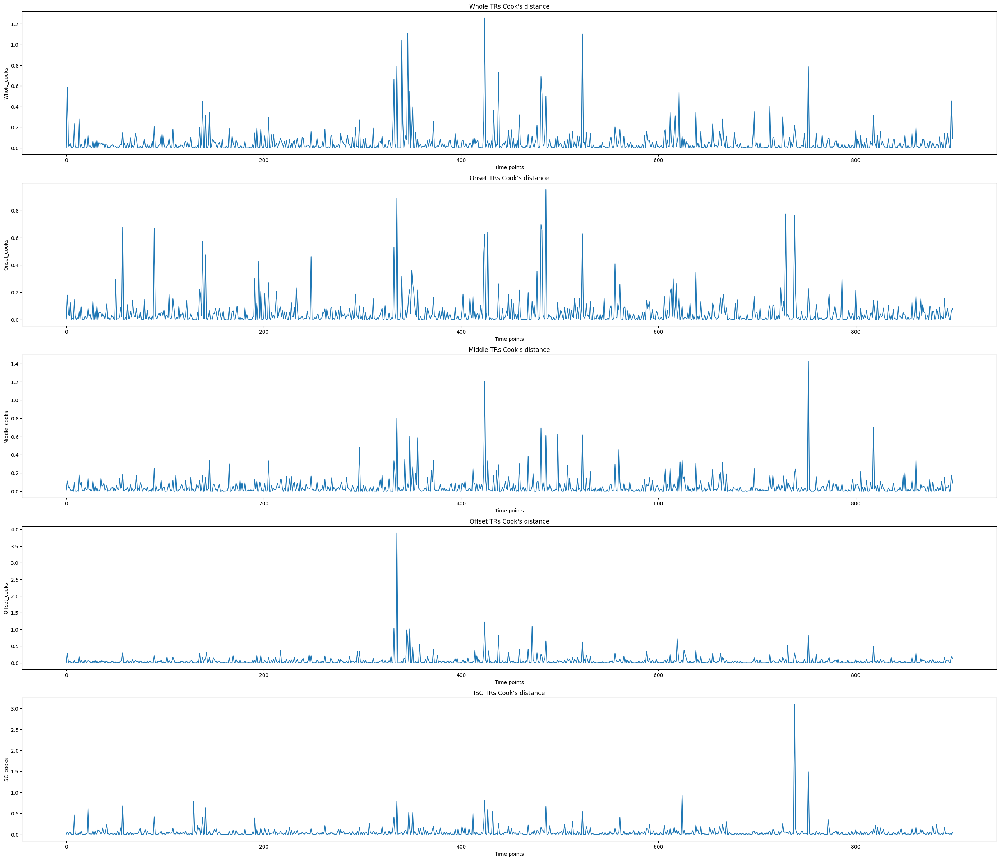

In [73]:
# Visualize cooks distance for each model.

fig, axs = plt.subplots(5, 1, figsize=(35, 30), sharex=False) 

time_points = np.arange(all_subs_events_df.shape[0])

sns.lineplot(data=all_subs_events_df, x=time_points, y='Whole_cooks', ax=axs[0])
axs[0].set_title("Whole TRs Cook's distance")
axs[0].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Onset_cooks', ax=axs[1])
axs[1].set_title("Onset TRs Cook's distance")
axs[1].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Middle_cooks', ax=axs[2])
axs[2].set_title("Middle TRs Cook's distance")
axs[2].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Offset_cooks', ax=axs[3])
axs[3].set_title("Offset TRs Cook's distance")
axs[3].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='ISC_cooks', ax=axs[4])
axs[4].set_title("ISC TRs Cook's distance")
axs[4].set_xlabel("Time points")



In [74]:
#all_subs_events_df.reset_index(drop=False, inplace=True)
#all_subs_events_df

In [75]:
drop_threshold = 1

# Drop rows with Cook's distance higher than the threshold.
all_subs_events_df = all_subs_events_df[all_subs_events_df['Whole_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Onset_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Middle_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Offset_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['ISC_cooks'] < drop_threshold]

print("The shape of the dataframe after dropping rows is: ", all_subs_events_df.shape)

The shape of the dataframe after dropping rows is:  (889, 119)


In [76]:
# np.set_printoptions(suppress=False)

# drop_threshold = 1

# rows_to_drop_whole = np.array(all_subs_events_df[all_subs_events_df["Whole_cooks"] > drop_threshold].index)
# rows_to_drop_onset = np.array(all_subs_events_df[all_subs_events_df["Onset_cooks"] > drop_threshold].index)
# rows_to_drop_middle = np.array(all_subs_events_df[all_subs_events_df["Middle_cooks"] > drop_threshold].index)
# rows_to_drop_offset = np.array(all_subs_events_df[all_subs_events_df["Offset_cooks"] > drop_threshold].index)
# rows_to_drop_ISC = np.array(all_subs_events_df[all_subs_events_df["ISC_cooks"] > drop_threshold].index)

# rows_to_drop = np.concatenate((rows_to_drop_whole, rows_to_drop_onset, rows_to_drop_middle, rows_to_drop_offset, rows_to_drop_ISC), axis=0)
# rows_to_drop = np.unique(rows_to_drop).tolist()

# # Check if all indices exist
# #indices_exist = all(idx in all_subs_events_df.index for idx in rows_to_drop)

# #print("All indices exist:", indices_exist)

# # Drop rows with high Cook's distance.
# print("Rows with outliers to drop: ", rows_to_drop)
# all_subs_events_df.drop(rows_to_drop, inplace=True)
# all_subs_events_df.reset_index(drop=True, inplace=True)

#print("The shape of the dataframe after dropping outliers is: ", all_subs_events_df.shape)

In [77]:

# # Drop outliers from positive arousal. 
# print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
# print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from negative arousal.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
# print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from watch score.

# # Drop outliers from NAcc.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] < 0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset"] < 0.58]
# print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from AIns.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -.8]
# print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from MPFC.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]
# all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_rm_outliers.csv')

# # Drop outliers from delta peaks.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] < 100]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] > -100]




In [78]:
# Separate files based on type of trailer. 
all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')

all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Comedy.csv')


In [79]:
all_subs_events_horror.head()

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC,Participant,Whole_cooks,Onset_cooks,Middle_cooks,Offset_cooks,ISC_cooks
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.145357,0.171728,0.087301,-0.028998,sub-01,0.001240,0.004633,0.014082,0.002295,0.006195
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,-0.033299,0.089549,-0.049391,0.048956,sub-01,0.589086,0.178640,0.110886,0.284112,0.056408
2,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.102559,-0.111868,-0.055374,0.068627,sub-01,0.022770,0.027226,0.041546,0.028884,0.037697
3,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,-0.351483,0.553435,0.454589,0.149986,sub-01,0.042681,0.125888,0.020063,0.030645,0.046269
4,sub-01,rh9,Horror,332.0,362.0,30,2,2,2,0.193406,...,0.371150,-0.328027,-0.471071,0.295040,sub-01,0.015067,0.002496,0.000474,0.001537,0.002403


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.6087 with a p-value of: 2.9924051219771823e-91
The correlation between W_score and Neg_arousal is: -0.1939 with a p-value of: 5.544793370358559e-09


Text(-1, -2, 'r= -0.1939; p-value: 5.544793370358559e-09')

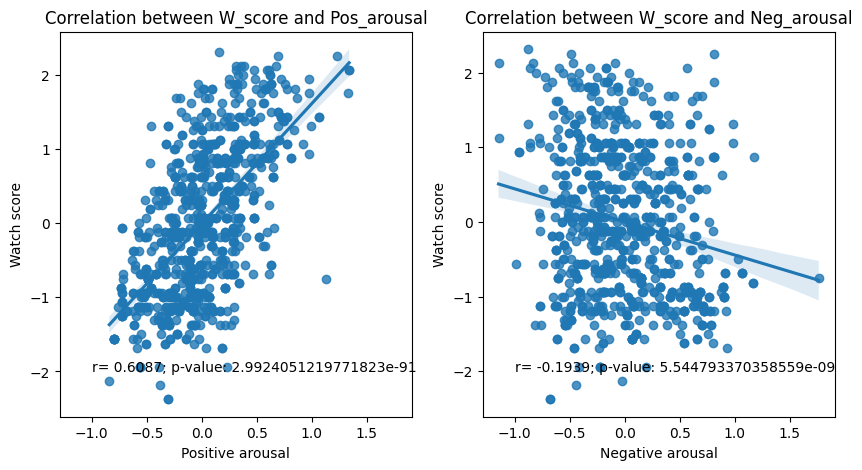

In [80]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)

# Plot the correlation between W_score and Pos_arousal.
W_PA_plot = sns.regplot(data=all_subs_events_df, x="Pos_arousal_scaled", y="W_score_scaled", ax=axs[0])
W_PA_plot.set_title("Correlation between W_score and Pos_arousal")
W_PA_plot.set_xlabel("Positive arousal")
W_PA_plot.set_ylabel("Watch score")

# Plot the correlation between W_score and Neg_arousal.
W_NA_plot = sns.regplot(data=all_subs_events_df, x="Neg_arousal_scaled", y="W_score_scaled", ax=axs[1])
W_NA_plot.set_title("Correlation between W_score and Neg_arousal")
W_NA_plot.set_xlabel("Negative arousal")
W_NA_plot.set_ylabel("Watch score")

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
axs[0].text(s=W_PA_string, x=-1, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
axs[1].text(s=W_NA_string, x=-1, y=-2, fontsize=10)


In [81]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.6579 with a p-value of: 8.943853771573103e-57
The correlation between W_score and Neg_arousal for comedy trailers is: -0.0069 with a p-value of: 0.8844247778746579

The correlation between W_score and Pos_arousal for horror trailers is: 0.4646 with a p-value of: 4.752080856800763e-25
The correlation between W_score and Neg_arousal for horror trailers is: -0.0881 with a p-value of: 0.06425521552338423


Text(-0.8, -2.5, 'H r= 0.4646; p-value: 4.752080856800763e-25')

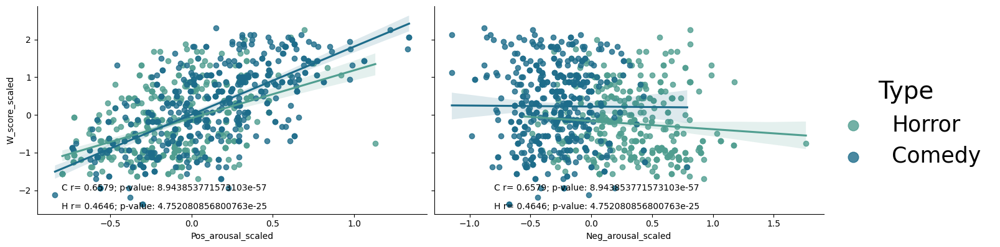

In [82]:

all_participants_cleaned_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')

W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
     all_participants_cleaned_df,
     kind="reg",
     x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
     y_vars=["W_score_scaled"], 
     palette="crest",
     hue="Type",
     height=4,
     aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

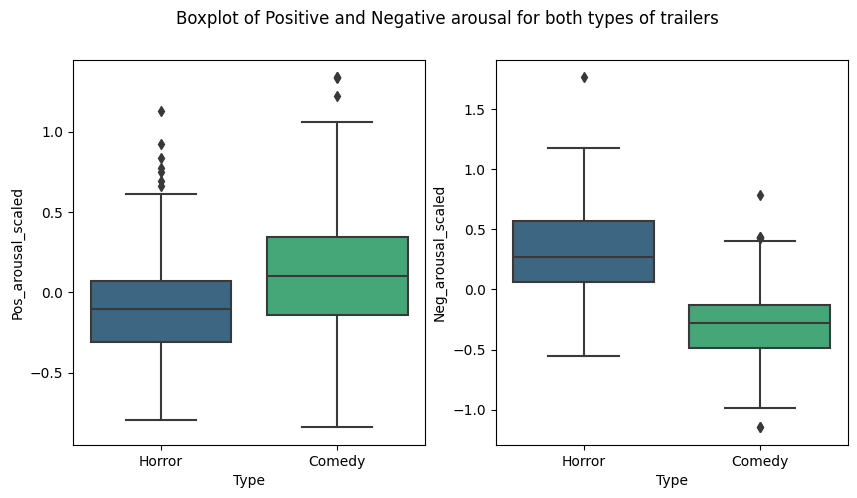

In [83]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

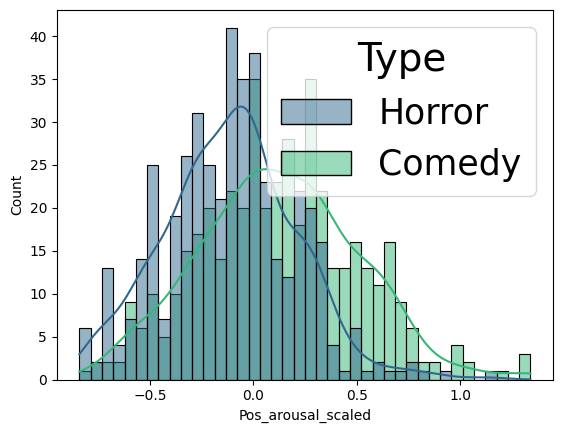

In [84]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='Neg_arousal_scaled', ylabel='Count'>

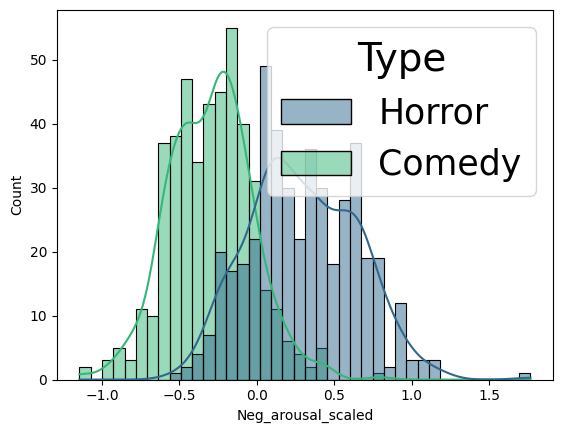

In [85]:
sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)

<Axes: xlabel='W_score_scaled', ylabel='Count'>

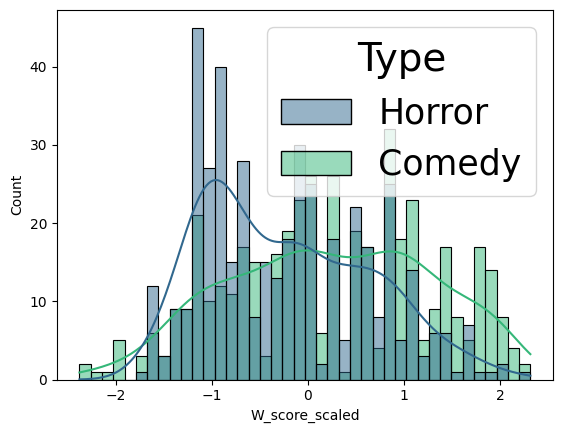

In [86]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

In [87]:
#sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

The correlation between NAcc_whole activation and positive arousal is: -0.00181 with a p-value of: 0.957088599811138
The correlation between AIns_whole activation and positive arousal is: -0.05267 with a p-value of: 0.11655028583437721
The correlation between MPFC_whole activation and positive arousal is: -0.03675 with a p-value of: 0.27374415988712475

The correlation between NAcc_whole activation and negative arousal is: 0.06696 with a p-value of: 0.04595067836205415
The correlation between AIns_whole activation and negative arousal is: 0.24796 with a p-value of: 6.376554613546023e-14
The correlation between MPFC_whole activation and negative arousal is: -0.00764 with a p-value of: 0.8201005189349371

The correlation between NAcc_whole activation and watch scores is: 0.00363 with a p-value of: 0.9138308202506573
The correlation between AIns_whole activation and watch scores is: -0.03703 with a p-value of: 0.27002873487328816
The correlation between MPFC_whole activation and watch sco

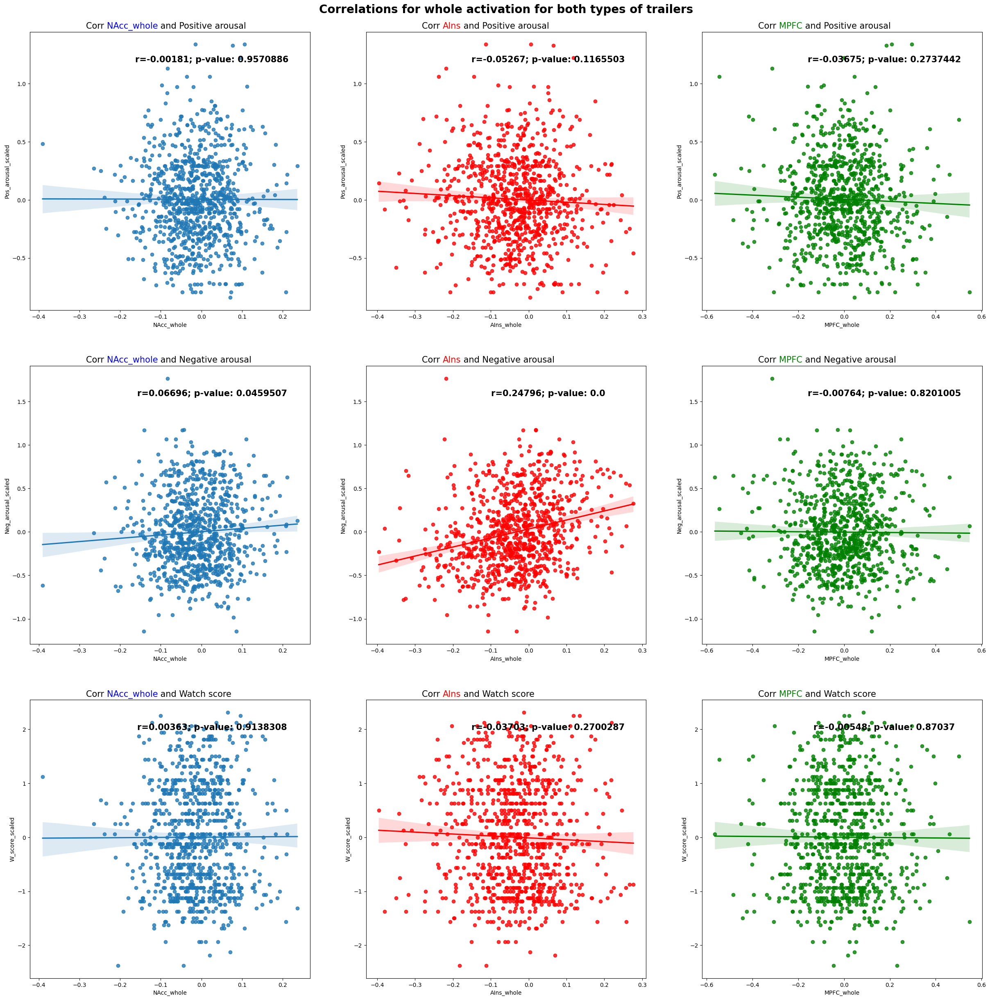

In [88]:
test_title = "Correlations for whole activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "whole", test_title)

The correlation between NAcc_whole activation and positive arousal for Comedy trailers is: 0.06661 with a p-value of: 0.1597801637522499
The correlation between AIns_whole activation and positive arousal for Comedy trailers is: 0.09545 with a p-value of: 0.04369402827370472
The correlation between MPFC_whole activation and positive arousal for Comedy trailers is: -0.04227 with a p-value of: 0.3726126359309178

The correlation between NAcc_whole activation and negative arousal for Comedy trailers is: 0.03829 with a p-value of: 0.41933108132336594
The correlation between AIns_whole activation and negative arousal for Comedy trailers is: 0.05835 with a p-value of: 0.21821645137607687
The correlation between MPFC_whole activation and negative arousal for Comedy trailers is: 0.00324 with a p-value of: 0.9454676301864303

The correlation between NAcc_whole activation and watch scores for Comedy trailers is: 0.06628 with a p-value of: 0.1618156601712857
The correlation between AIns_whole acti

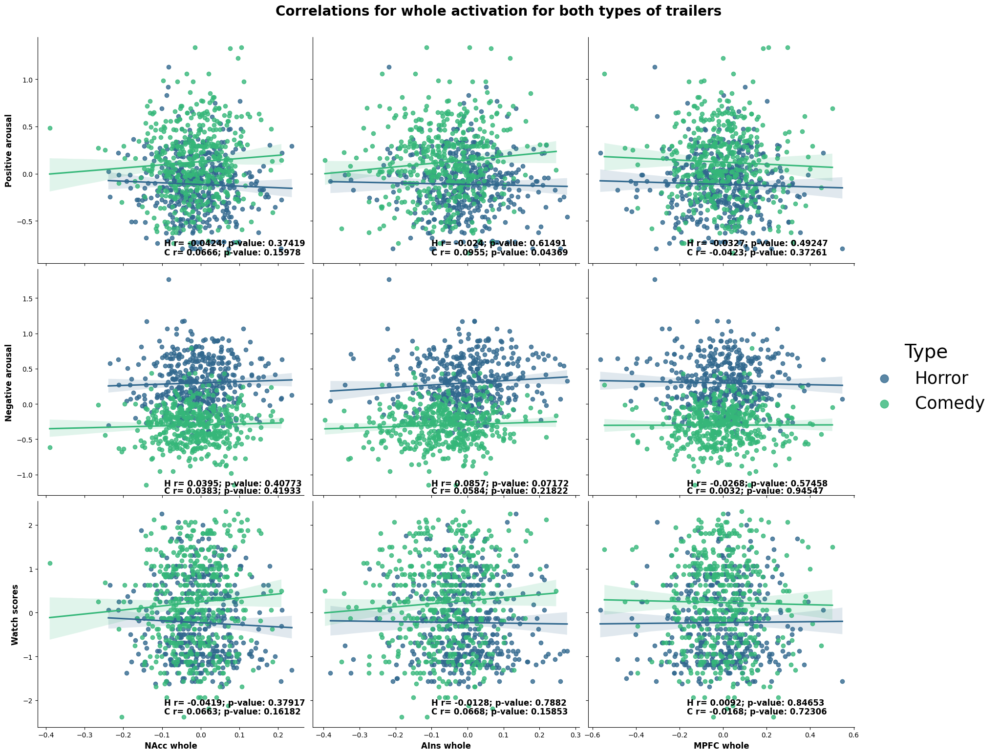

In [89]:

compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "whole", "Correlations for whole activation for both types of trailers")


## Neural Activation Offset 

The correlation between NAcc_offset activation and positive arousal is: -0.0351 with a p-value of: 0.2957952671269211
The correlation between AIns_offset activation and positive arousal is: -0.05296 with a p-value of: 0.11457359966615667
The correlation between MPFC_offset activation and positive arousal is: -0.01883 with a p-value of: 0.575095324628964

The correlation between NAcc_offset activation and negative arousal is: 0.01351 with a p-value of: 0.6875073481164213
The correlation between AIns_offset activation and negative arousal is: 0.19943 with a p-value of: 1.993399869721273e-09
The correlation between MPFC_offset activation and negative arousal is: -0.01882 with a p-value of: 0.5752538572112182

The correlation between NAcc_offset activation and watch scores is: -0.01073 with a p-value of: 0.7492576790985827
The correlation between AIns_offset activation and watch scores is: -0.06904 with a p-value of: 0.03957077419035068
The correlation between MPFC_offset activation and wa

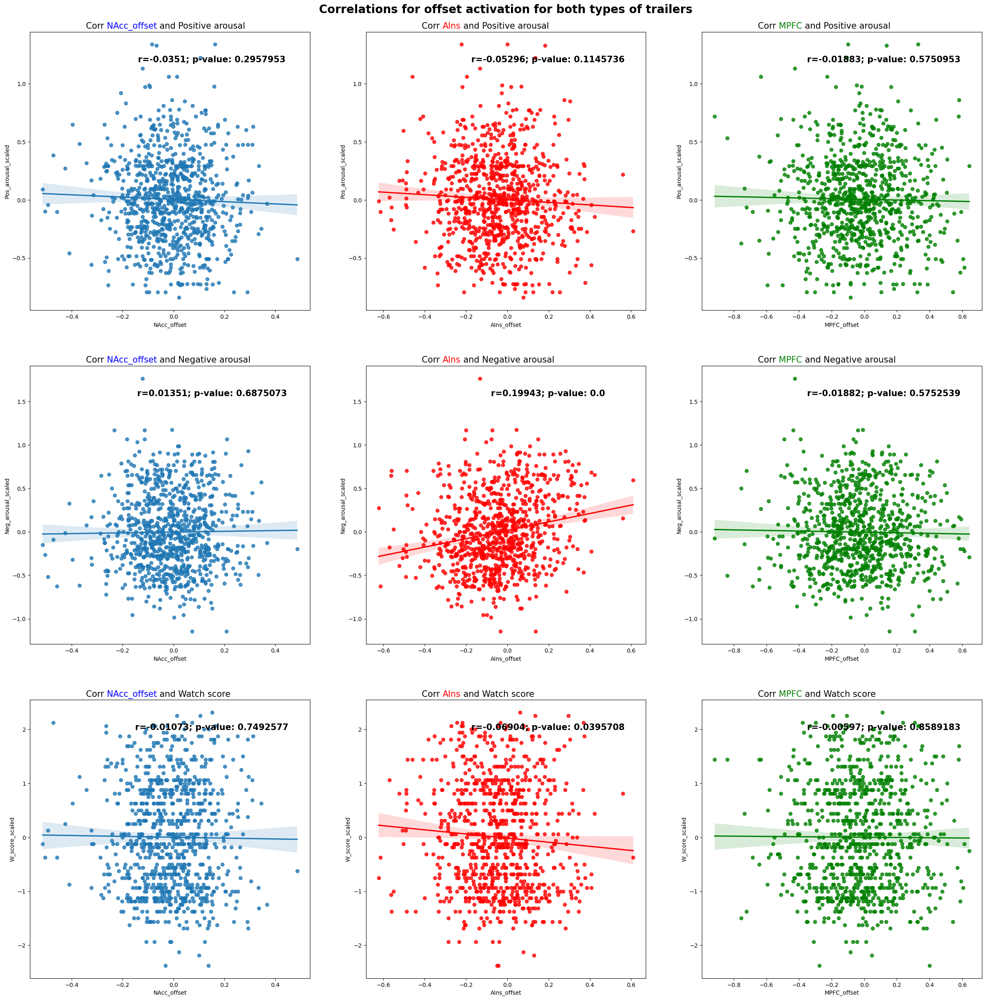

In [90]:
offset_title = "Correlations for offset activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "offset", offset_title)

The correlation between NAcc_offset activation and positive arousal for Comedy trailers is: -0.05443 with a p-value of: 0.2508318943192968
The correlation between AIns_offset activation and positive arousal for Comedy trailers is: 0.04287 with a p-value of: 0.3658269407425017
The correlation between MPFC_offset activation and positive arousal for Comedy trailers is: -0.00605 with a p-value of: 0.8985298317343522

The correlation between NAcc_offset activation and negative arousal for Comedy trailers is: -0.03078 with a p-value of: 0.5163309724930086
The correlation between AIns_offset activation and negative arousal for Comedy trailers is: 0.04368 with a p-value of: 0.35687508967001047
The correlation between MPFC_offset activation and negative arousal for Comedy trailers is: -0.01668 with a p-value of: 0.7250074477719628

The correlation between NAcc_offset activation and watch scores for Comedy trailers is: -0.04071 with a p-value of: 0.39057168849756063
The correlation between AIns_

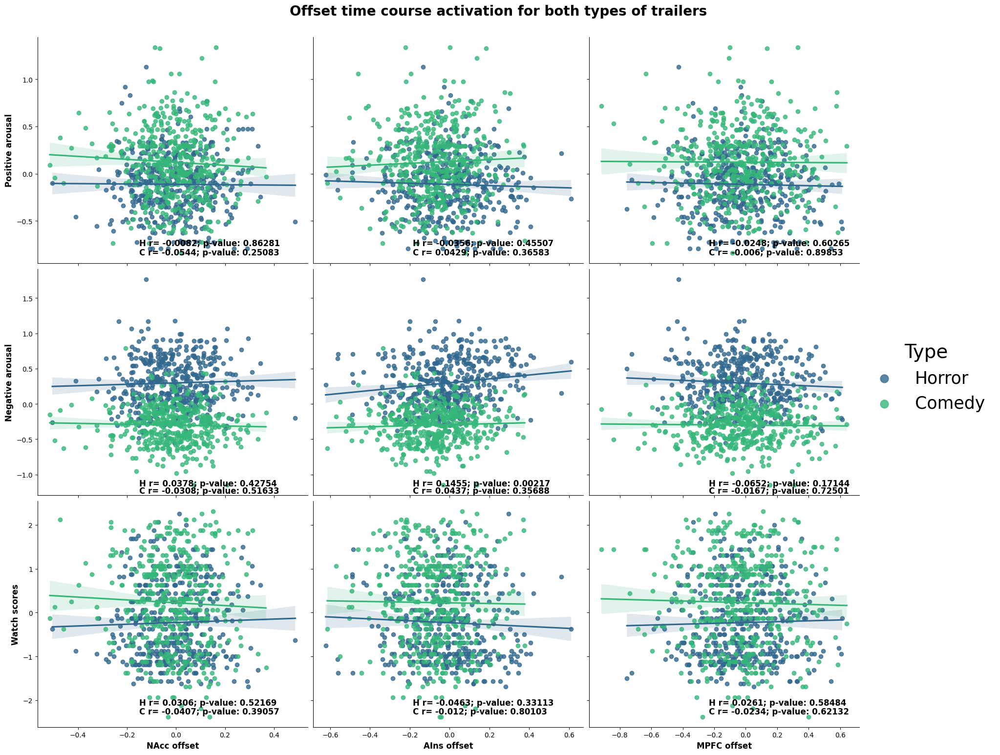

In [91]:
offset_title = 'Offset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "offset", offset_title)


# Neural activation middle

The correlation between NAcc_middle activation and positive arousal is: -0.01096 with a p-value of: 0.7441823063590972
The correlation between AIns_middle activation and positive arousal is: -0.05178 with a p-value of: 0.12290506889281899
The correlation between MPFC_middle activation and positive arousal is: -0.0772 with a p-value of: 0.021340076932509323

The correlation between NAcc_middle activation and negative arousal is: 0.07129 with a p-value of: 0.03355188008502792
The correlation between AIns_middle activation and negative arousal is: 0.18281 with a p-value of: 4.0347896903899164e-08
The correlation between MPFC_middle activation and negative arousal is: -0.00551 with a p-value of: 0.869634382626138

The correlation between NAcc_middle activation and watch scores is: 0.00396 with a p-value of: 0.9061186238607353
The correlation between AIns_middle activation and watch scores is: -0.01666 with a p-value of: 0.6199381263811192
The correlation between MPFC_middle activation and 

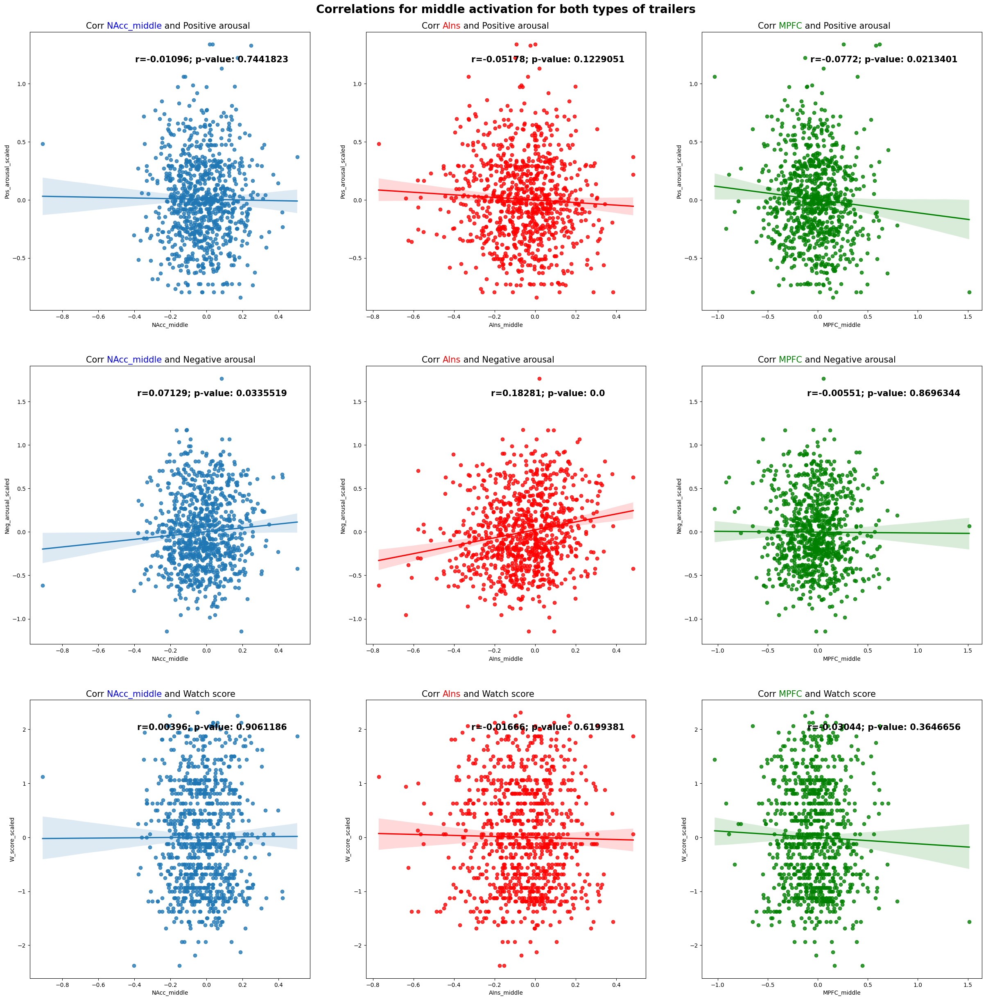

In [92]:
middle_title = "Correlations for middle activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "middle", middle_title)

The correlation between NAcc_middle activation and positive arousal for Comedy trailers is: 0.02382 with a p-value of: 0.615457291511207
The correlation between AIns_middle activation and positive arousal for Comedy trailers is: 0.03532 with a p-value of: 0.45633802922044414
The correlation between MPFC_middle activation and positive arousal for Comedy trailers is: -0.06706 with a p-value of: 0.1569674063804327

The correlation between NAcc_middle activation and negative arousal for Comedy trailers is: 0.04725 with a p-value of: 0.3188538378362673
The correlation between AIns_middle activation and negative arousal for Comedy trailers is: 0.01591 with a p-value of: 0.7372032251360061
The correlation between MPFC_middle activation and negative arousal for Comedy trailers is: -0.03631 with a p-value of: 0.44381453776091045

The correlation between NAcc_middle activation and watch scores for Comedy trailers is: 0.06452 with a p-value of: 0.1733056647125343
The correlation between AIns_midd

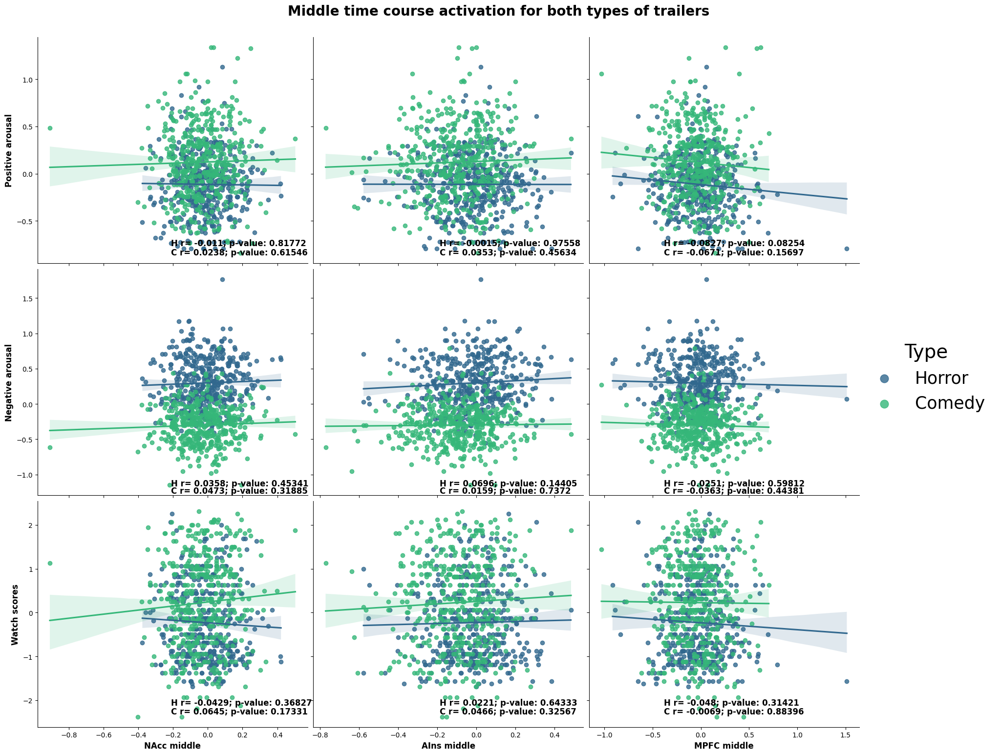

In [93]:
middle_title = 'Middle time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "middle", middle_title)

## Neural activation onset

The correlation between NAcc_onset activation and positive arousal is: 0.0396 with a p-value of: 0.2382325137855915
The correlation between AIns_onset activation and positive arousal is: 0.01218 with a p-value of: 0.7169267389669203
The correlation between MPFC_onset activation and positive arousal is: 0.03056 with a p-value of: 0.3626988751366114

The correlation between NAcc_onset activation and negative arousal is: 0.02453 with a p-value of: 0.46513962519638974
The correlation between AIns_onset activation and negative arousal is: 0.05638 with a p-value of: 0.09295966162215479
The correlation between MPFC_onset activation and negative arousal is: 0.01025 with a p-value of: 0.7603162008525002

The correlation between NAcc_onset activation and watch scores is: 0.01168 with a p-value of: 0.7281044443414324
The correlation between AIns_onset activation and watch scores is: 0.0218 with a p-value of: 0.5162146548396003
The correlation between MPFC_onset activation and watch scores is: 0.0

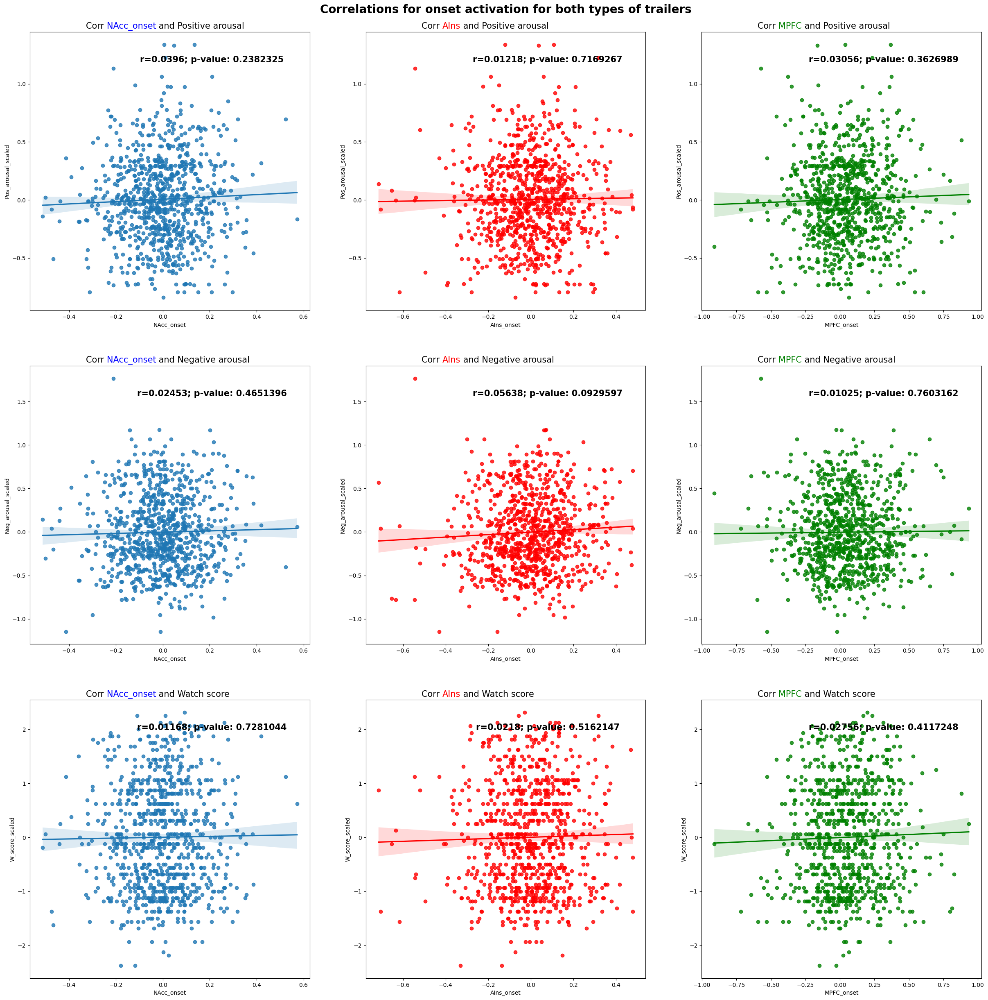

In [94]:
onset_title = "Correlations for onset activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "onset", onset_title)

The correlation between NAcc_onset activation and positive arousal for Comedy trailers is: 0.13234 with a p-value of: 0.005072517609818989
The correlation between AIns_onset activation and positive arousal for Comedy trailers is: 0.08777 with a p-value of: 0.06374713466812174
The correlation between MPFC_onset activation and positive arousal for Comedy trailers is: -0.00418 with a p-value of: 0.9298082476805464

The correlation between NAcc_onset activation and negative arousal for Comedy trailers is: 0.04125 with a p-value of: 0.38428958258524715
The correlation between AIns_onset activation and negative arousal for Comedy trailers is: 0.04261 with a p-value of: 0.36877455567438755
The correlation between MPFC_onset activation and negative arousal for Comedy trailers is: 0.06323 with a p-value of: 0.1820735622482402

The correlation between NAcc_onset activation and watch scores for Comedy trailers is: 0.07746 with a p-value of: 0.1019095092613784
The correlation between AIns_onset ac

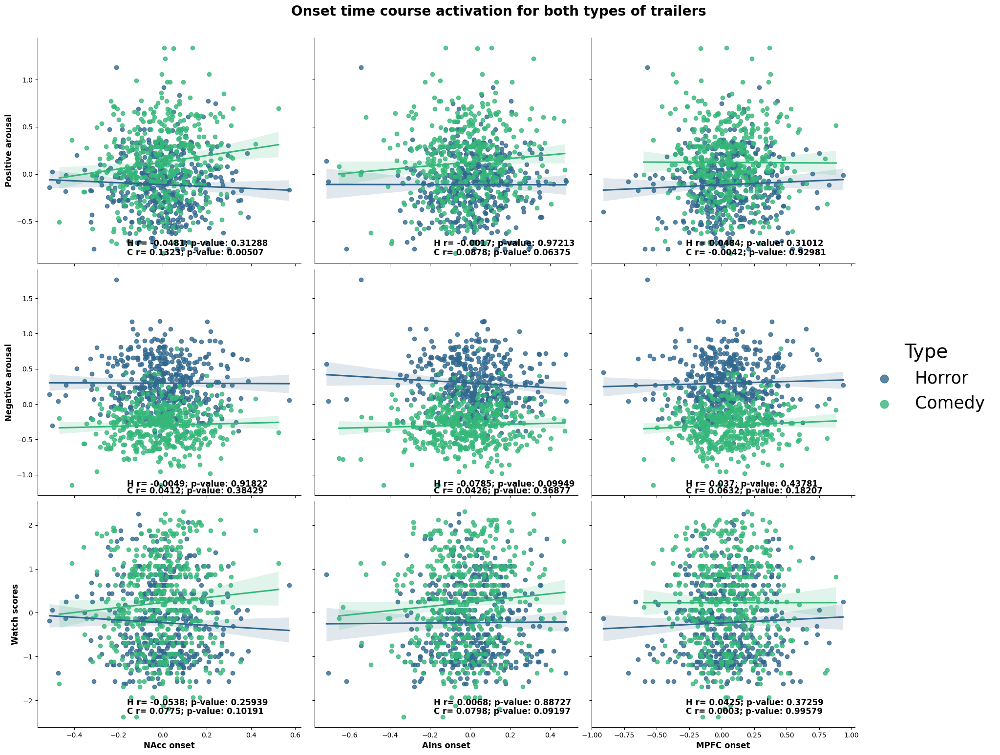

In [95]:
onset_title = 'Onset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "onset", onset_title)

## Peak Max

The correlation between NAcc_pos_peak activation and positive arousal is: 0.00451 with a p-value of: 0.893253089653795
The correlation between AIns_pos_peak activation and positive arousal is: 0.005 with a p-value of: 0.8817417003021767
The correlation between MPFC_pos_peak activation and positive arousal is: -0.01032 with a p-value of: 0.7587355286985975

The correlation between NAcc_pos_peak activation and negative arousal is: 0.04667 with a p-value of: 0.16446164013643538
The correlation between AIns_pos_peak activation and negative arousal is: 0.12658 with a p-value of: 0.0001542479946270368
The correlation between MPFC_pos_peak activation and negative arousal is: 0.01411 with a p-value of: 0.6743378450538947

The correlation between NAcc_pos_peak activation and watch scores is: -0.00479 with a p-value of: 0.8864932095107038
The correlation between AIns_pos_peak activation and watch scores is: 0.01291 with a p-value of: 0.7007713846075396
The correlation between MPFC_pos_peak activ

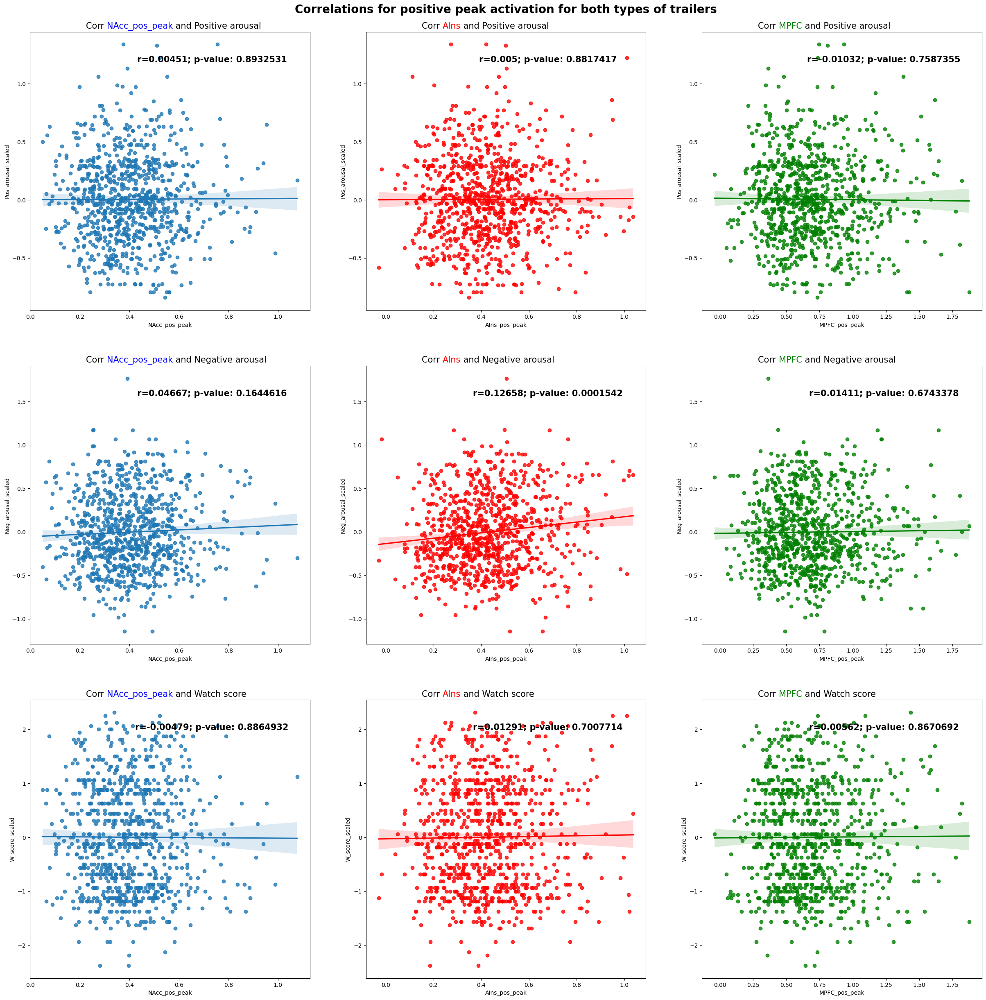

In [96]:
pos_peak_title = "Correlations for positive peak activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "pos_peak", pos_peak_title)

The correlation between NAcc_pos_peak activation and positive arousal for Comedy trailers is: 0.05503 with a p-value of: 0.2455768906213784
The correlation between AIns_pos_peak activation and positive arousal for Comedy trailers is: 0.03771 with a p-value of: 0.42643587024879775
The correlation between MPFC_pos_peak activation and positive arousal for Comedy trailers is: -0.01554 with a p-value of: 0.7431580403052722

The correlation between NAcc_pos_peak activation and negative arousal for Comedy trailers is: 0.01714 with a p-value of: 0.7178280496082197
The correlation between AIns_pos_peak activation and negative arousal for Comedy trailers is: -0.02058 with a p-value of: 0.6642631656795149
The correlation between MPFC_pos_peak activation and negative arousal for Comedy trailers is: 0.04338 with a p-value of: 0.36020330351948265

The correlation between NAcc_pos_peak activation and watch scores for Comedy trailers is: 0.07169 with a p-value of: 0.1301793498924267
The correlation be

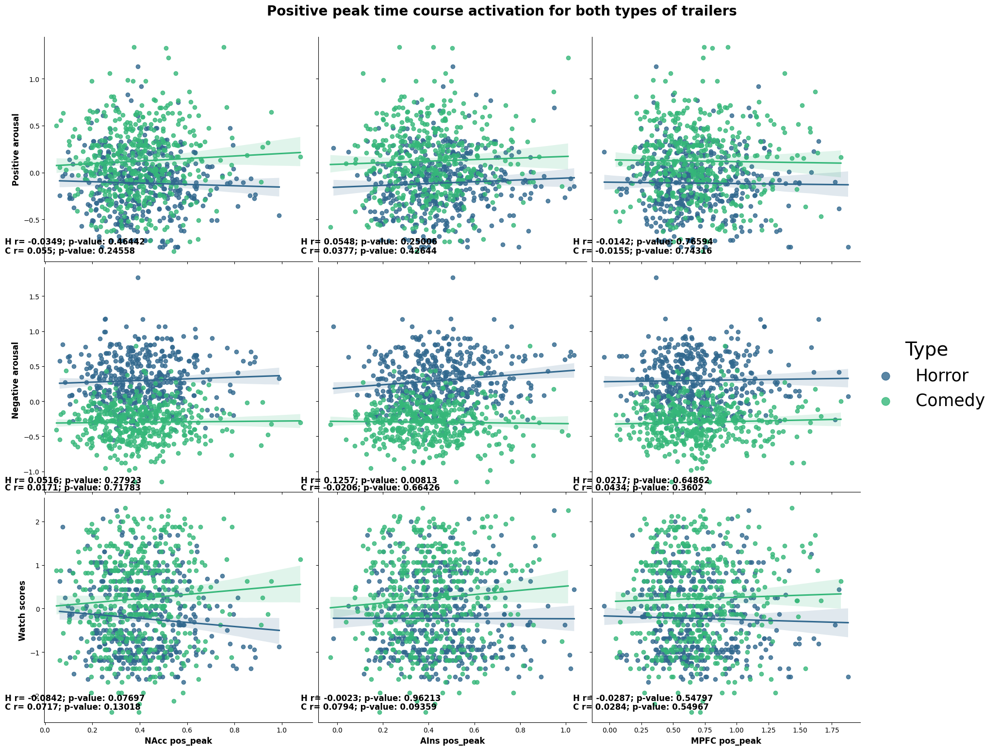

In [97]:
pos_peak_title = 'Positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "pos_peak", pos_peak_title)

## Peak min

The correlation between NAcc_neg_peak activation and positive arousal is: 0.02701 with a p-value of: 0.4212250007919264
The correlation between AIns_neg_peak activation and positive arousal is: -0.06258 with a p-value of: 0.062177625406689335
The correlation between MPFC_neg_peak activation and positive arousal is: 0.00713 with a p-value of: 0.8317766321697647

The correlation between NAcc_neg_peak activation and negative arousal is: 0.02537 with a p-value of: 0.4499738669790782
The correlation between AIns_neg_peak activation and negative arousal is: 0.15918 with a p-value of: 1.8426904745544147e-06
The correlation between MPFC_neg_peak activation and negative arousal is: 0.00763 with a p-value of: 0.8203149777605482

The correlation between NAcc_neg_peak activation and watch scores is: 0.02774 with a p-value of: 0.4087356610010951
The correlation between AIns_neg_peak activation and watch scores is: -0.03842 with a p-value of: 0.25252926730304553
The correlation between MPFC_neg_peak

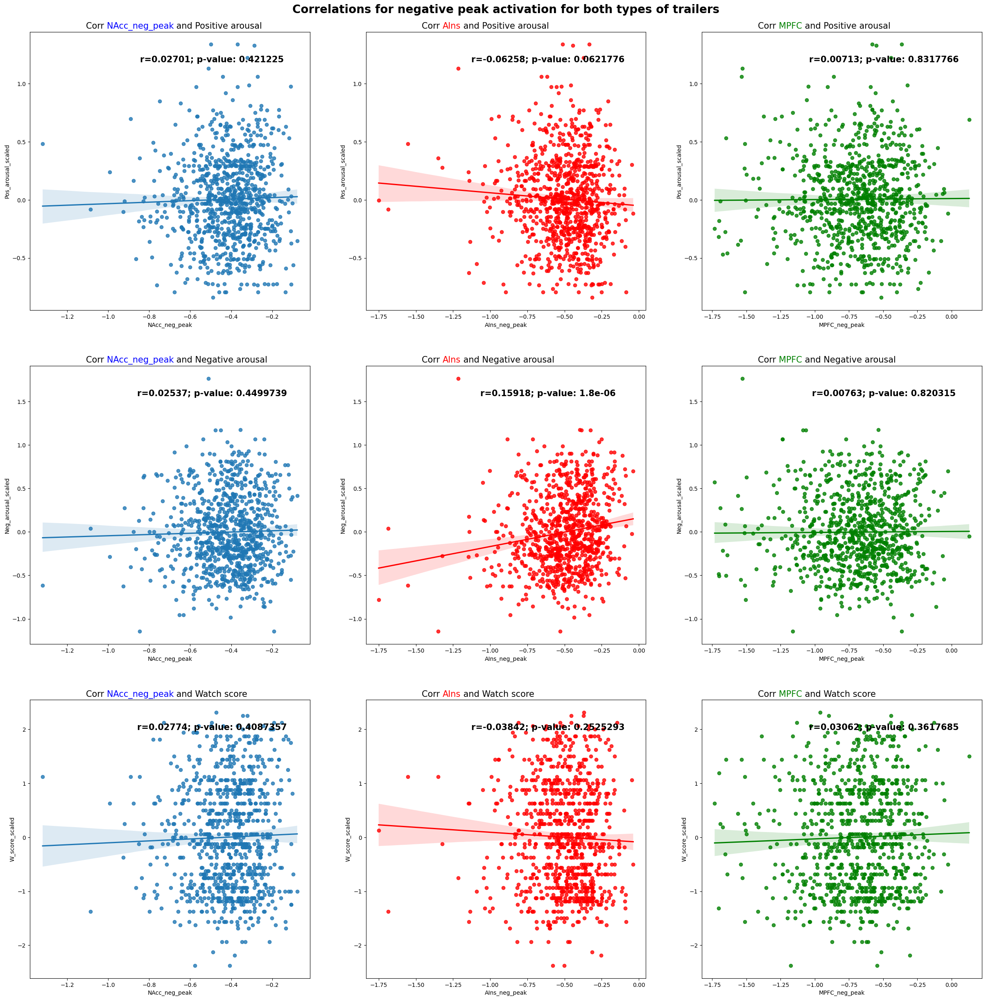

In [98]:
neg_peak_title = "Correlations for negative peak activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "neg_peak", neg_peak_title)

The correlation between NAcc_neg_peak activation and positive arousal for Comedy trailers is: 0.06488 with a p-value of: 0.170874477006252
The correlation between AIns_neg_peak activation and positive arousal for Comedy trailers is: 0.06841 with a p-value of: 0.14871704975369188
The correlation between MPFC_neg_peak activation and positive arousal for Comedy trailers is: 0.02338 with a p-value of: 0.6219929987768765

The correlation between NAcc_neg_peak activation and negative arousal for Comedy trailers is: 0.0509 with a p-value of: 0.2829117163497488
The correlation between AIns_neg_peak activation and negative arousal for Comedy trailers is: 0.08234 with a p-value of: 0.08203626472193301
The correlation between MPFC_neg_peak activation and negative arousal for Comedy trailers is: -0.017 with a p-value of: 0.7200878907721143

The correlation between NAcc_neg_peak activation and watch scores for Comedy trailers is: 0.01846 with a p-value of: 0.6970979281630125
The correlation between

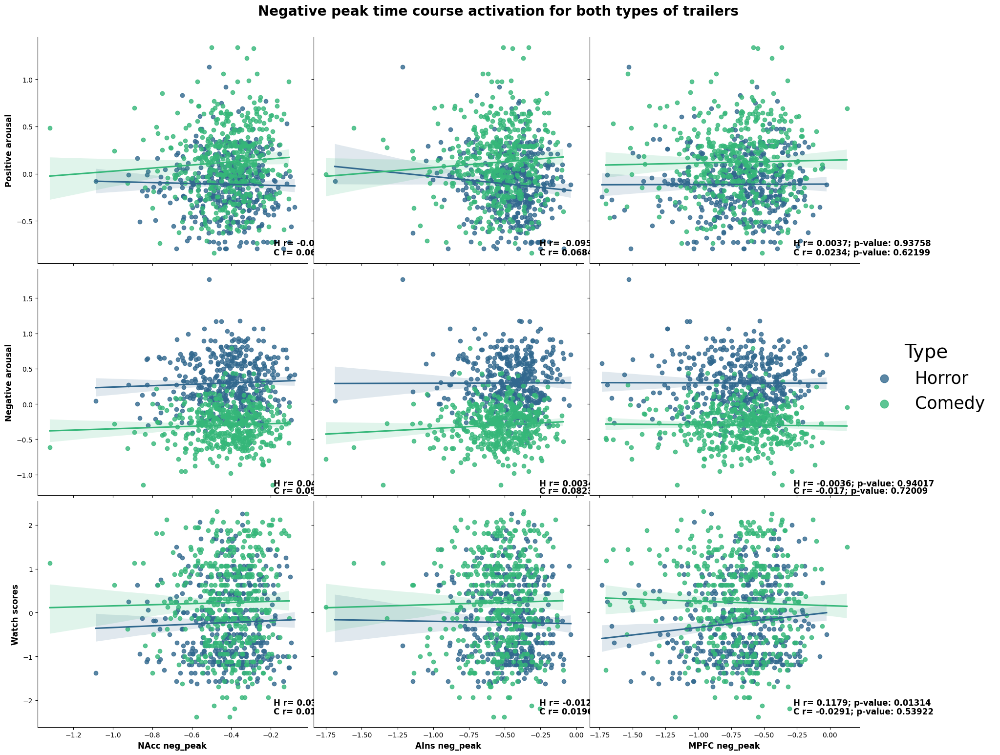

In [99]:
neg_peak_title = 'Negative peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "neg_peak", neg_peak_title)

## Positive peak (slope) 

The correlation between NAcc_slope_peak activation and positive arousal is: 0.01942 with a p-value of: 0.6139020743323702
The correlation between AIns_slope_peak activation and positive arousal is: -0.07792 with a p-value of: 0.042675895452818136
The correlation between MPFC_slope_peak activation and positive arousal is: -0.01281 with a p-value of: 0.7393353104192324

The correlation between NAcc_slope_peak activation and negative arousal is: -0.07467 with a p-value of: 0.0521366379271831
The correlation between AIns_slope_peak activation and negative arousal is: 0.03619 with a p-value of: 0.34714959310337723
The correlation between MPFC_slope_peak activation and negative arousal is: 0.00777 with a p-value of: 0.8400840307671832

The correlation between NAcc_slope_peak activation and watch scores is: 0.02194 with a p-value of: 0.568803895171039
The correlation between AIns_slope_peak activation and watch scores is: -0.1061 with a p-value of: 0.005722648460023635
The correlation between

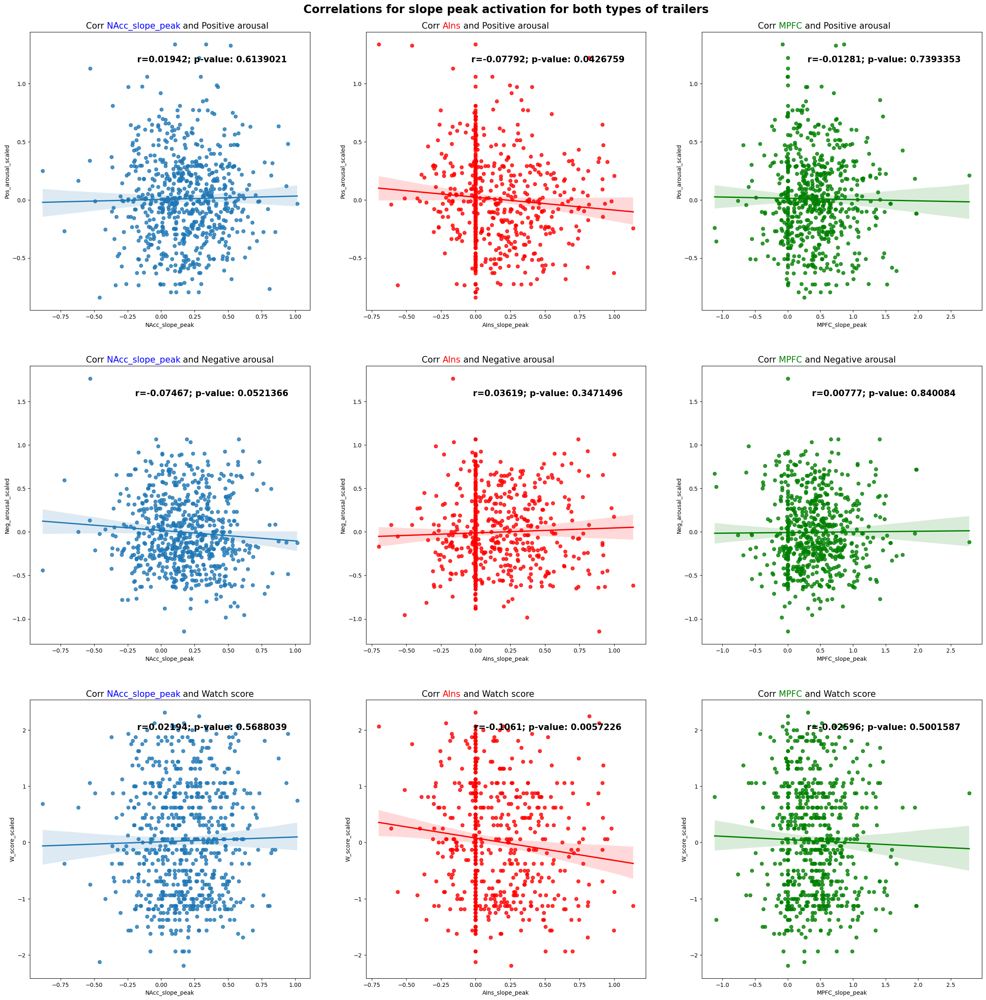

In [100]:
# Drop outliers from delta peaks.
all_subs_events_slope_df = all_subs_events_df[(all_subs_events_df["NAcc_slope_peak"] != 0) ] #& (all_subs_events_df["AIns_slope_peak"] != 0) & (all_subs_events_df["MPFC_slope_peak"] != 0)
all_subs_events_slope_horror_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Horror"]
all_subs_events_slope_comedy_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Comedy"]


pos_slope_peak_title = "Correlations for slope peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_slope_df, "slope_peak", pos_slope_peak_title)

In [101]:
#pos_slope_peak_title = 'Slope peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_slope_df, all_subs_events_slope_comedy_df, all_subs_events_slope_horror_df, "slope_peak", pos_slope_peak_title)


## Narrow slope peak 

In [102]:
#narrow_slope_peak_title = "Correlations for narrow slope peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_slope_peak", narrow_slope_peak_title)

In [103]:
#narrow_slope_peak_title = 'Narrow slope peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_slope_peak", narrow_slope_peak_title)

## Positive peak (delta)

In [104]:
#delta_peak_title = "Correlations for delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "delta_peak", delta_peak_title)

In [105]:
#delta_peak_title = 'Delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "delta_peak", delta_peak_title)

## Narrow delta peak 

In [106]:
#narrow_delta_peak_title = "Correlations for narrow delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_delta_peak", narrow_delta_peak_title)

In [107]:
#narrow_delta_peak_title = 'Narrow delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_delta_peak", narrow_delta_peak_title)

## Neural ISC

In [108]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.03744 with a p-value of: 0.2648492166666385
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.02397 with a p-value of: 0.47539151807547414
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.06795 with a p-value of: 0.04281851536362159

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.0062 with a p-value of: 0.8536381747014796
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: 0.00218 with a p-value of: 0.9482545621521444
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: 0.07534 with a p-value of: 0.024673036409253377

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.06899 with a p-value of: 0.03973930174173

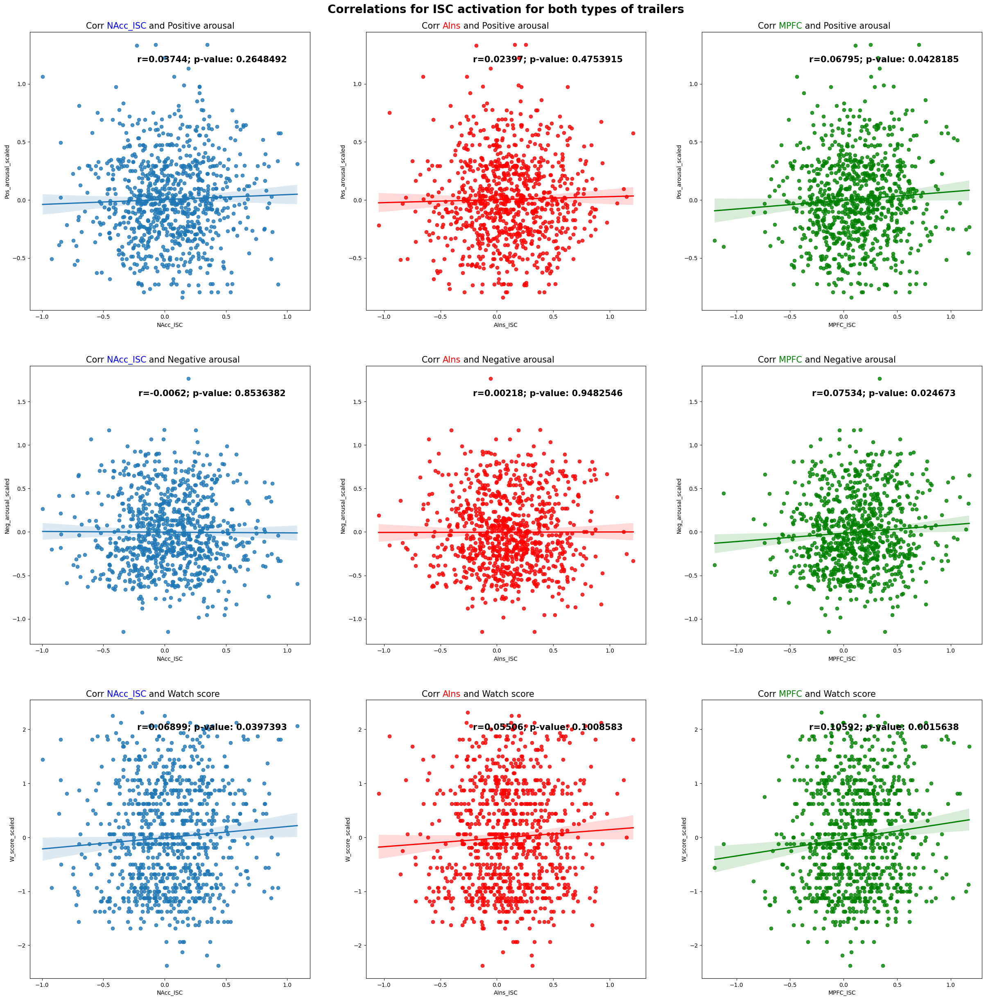

In [109]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [110]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.10537 with a p-value of: 0.02589649816520346
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.0196 with a p-value of: 0.6794536591762326
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.12878 with a p-value of: 0.006402360089381342

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.00471 with a p-value of: 0.9209735063172619
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.00957 with a p-value of: 0.8401109795364919
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: 0.02832 with a p-value of: 0.550323104191096

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.11752 with a p-value of: 0.012903917342059467
For comedy trailers, the correlation between 

In [111]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.05132 with a p-value of: 0.28163837929329977
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.00595 with a p-value of: 0.9007504054862375
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.02465 with a p-value of: 0.6053297770379255

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.01393 with a p-value of: 0.7702966638399407
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.10118 with a p-value of: 0.03345721104199333
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.11346 with a p-value of: 0.01702038201654943

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.00644 with a p-value of: 0.892615746928154
For horror trailers, the correlation between 

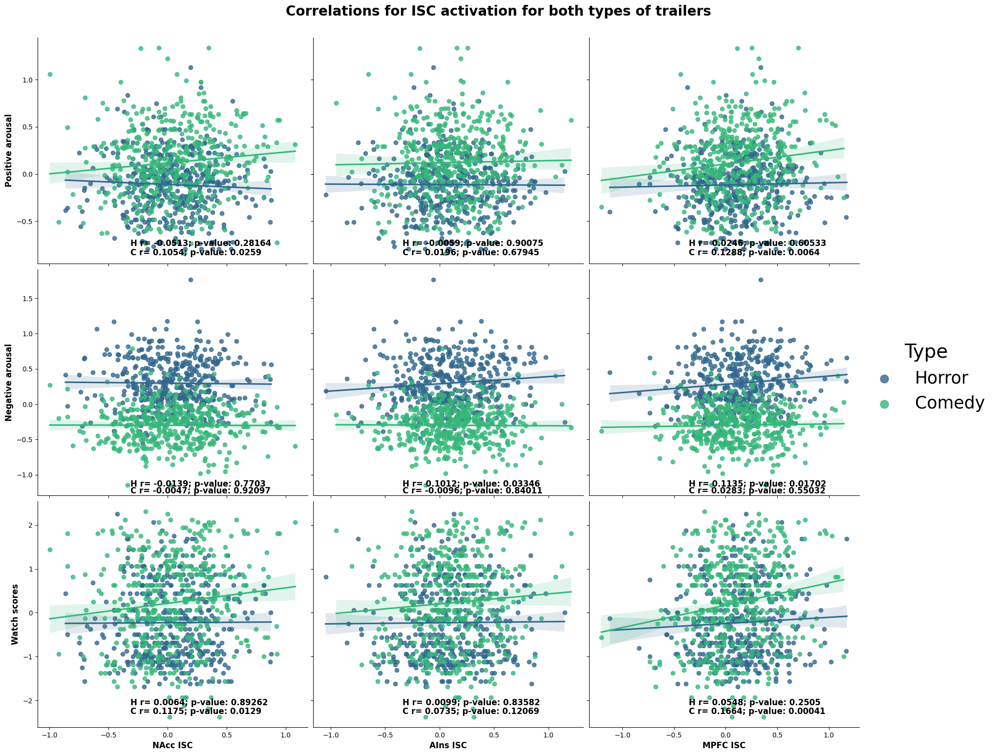

In [112]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_participants_cleaned_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


## Neural Coupling Correlations.

In [113]:
# NC_plot_test = sns.pairplot(
#     all_subs_events_df,
#     kind="reg",
#     x_vars=['NAcc_MPFC_ISFC', 'AIns_MPFC_ISFC', 'NAcc_AIns_ISFC', 'AIns_NAcc_ISFC', 'MPFC_NAcc_ISFC'], #, 'MPFC_AIns_ISFC'
#     y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
#         hue="Type",
#         palette="viridis", 
#         #scatter_kws = {"s":3} try to change the size of the dots
#         height=8,
#         aspect=1.2)

# Format data for LMM analysis.

In [114]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

root_path = os.getcwd()

Current working dir : /Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData


In [115]:
# After dropping outliers from the neural activation data, save the new dataframe to a csv file.
# Calculate the mean measures for each trailer accross participants.
aggregate_df = all_participants_cleaned_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_df.reset_index(inplace=True)

type_list = []
for id_trailer in range(len(aggregate_df)):
    if "c" in aggregate_df["Trailer"][id_trailer]:
        type_list.append("comedy")
    else:
        type_list.append("horror")

aggregate_df["Type"] = type_list

# I'm not sure why, but I am loosing the 'W_score' column. 
# I will add it back to the dataframe.
w_scores_dict = {}
for trailer_id in all_subs_events_df["Trailer"].unique():
    current_trailer_mean_w_score = all_subs_events_df[all_subs_events_df["Trailer"] == trailer_id]["W_score"].mean()
    w_scores_dict[trailer_id] = current_trailer_mean_w_score
    # Print scores as a sanity check.
    #print("For current trailer: " + trailer_id + " the mean W_score is: " + str(current_trailer_mean_w_score))

w_scores_list = []
for trailer_id in aggregate_df["Trailer"].unique():
    w_scores_list.append(w_scores_dict[trailer_id])

aggregate_df["W_score"] = w_scores_list


# Re-order columns.
cols_ordered = ['Trailer', 'Type', 'Onset', 'Offset', 'Pos_arousal', 'Neg_arousal',
        'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score', 'W_score_scaled',
        'NAcc_onset', 'AIns_onset', 'MPFC_onset',
        'NAcc_middle', 'AIns_middle', 'MPFC_middle', 'NAcc_offset',
        'AIns_offset', 'MPFC_offset', 
        'NAcc_onset_z', 'AIns_onset_z', 'MPFC_onset_z', 'NAcc_middle_z',
        'AIns_middle_z', 'MPFC_middle_z', 'NAcc_offset_z', 'AIns_offset_z',
        'MPFC_offset_z', 'NAcc_whole', 'AIns_whole', 'MPFC_whole',
        'NAcc_whole_z', 'AIns_whole_z', 'MPFC_whole_z', 'NAcc_pos_peak',
        'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
        'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
        'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
        'MPFC_slope_peak_avg', 
        #'NAcc_narrow_slope_peak',
        #'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
        #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
        #'MPFC_narrow_slope_peak_avg', 
        'NAcc_delta_peak', 'AIns_delta_peak',
        'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
        'MPFC_delta_peak_avg', 
        #'NAcc_narrow_delta_peak',
        #'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
        #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
        #'MPFC_narrow_delta_peak_avg', 
        'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC',]

aggregate_df = aggregate_df[cols_ordered]

root_path = os.getcwd()

aggregate_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_clean.csv", index=True)
aggregate_df.head(40)

,Trailer,Type,Onset,Offset,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,...,MPFC_slope_peak_avg,NAcc_delta_peak,AIns_delta_peak,MPFC_delta_peak,NAcc_delta_peak_avg,AIns_delta_peak_avg,MPFC_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,rc1,comedy,108.0,138.0,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,...,0.382719,-1.338826,0.001969,0.010565,-0.660082,0.003781,0.010868,0.199772,0.083193,0.113225
1,rc10,comedy,568.0,598.0,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,...,0.330126,0.004403,0.004078,0.010126,0.002966,0.004164,0.008597,0.025056,0.076848,0.077092
2,rc11,comedy,512.0,542.0,1.437143,-0.355509,0.022929,-0.355509,2.035714,-0.276786,...,0.260222,0.004256,0.000999,-0.005555,0.001482,0.002469,0.001411,-0.061036,0.183044,-0.023038
3,rc12,comedy,656.0,686.0,1.327725,-0.287918,-0.086488,-0.287918,1.888889,-0.428241,...,0.313890,0.000544,0.006246,0.063960,0.008373,0.004022,0.032589,-0.176798,-0.020507,0.045606
4,rc2,comedy,108.0,138.0,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,...,0.296763,0.009582,0.001905,0.003766,0.019766,0.003497,0.005272,-0.038312,0.132982,0.155184
5,rc3,comedy,12.0,42.0,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,...,0.323815,0.002533,0.001065,0.008073,0.001419,-0.001209,0.007612,-0.015998,0.084469,0.179588
6,rc4,comedy,332.0,362.0,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,...,0.256995,0.117460,-0.008257,0.012400,0.036191,-0.002014,0.010738,0.028410,0.057047,0.192742
7,rc5,comedy,700.0,730.0,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,...,0.338934,0.005314,0.006319,0.003981,0.010617,0.008547,0.004851,0.099379,0.115832,0.290629
8,rc6,comedy,420.0,450.0,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,...,0.189602,0.021715,-0.003623,0.000302,0.019110,-0.004222,0.010757,0.033368,0.305756,0.258807
9,rc7,comedy,660.0,690.0,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,...,0.365587,0.011347,0.005822,-0.003409,0.009142,0.005735,0.005727,0.172605,0.220944,0.082499


In [116]:
# Read aggregate metrics dataframe. 
aggregate_metricts_path = "/Users/luisalvarez/Documents/SpanLab/Aggregate_metrics_labeled.csv"

aggregate_metrics_df = pd.read_csv(aggregate_metricts_path)

# Remove nan.
aggregate_metrics_df.dropna(subset=['label'], inplace=True)
aggregate_metrics_df.reset_index(inplace=True)
aggregate_metrics_df

,index,number,title,label,year,Release time,genre,"released (1 = yes, 0 = no)",url to trailer,Domestic Gross,...,Total_weeks,Weeks_avg_per_theater,Gross_World_num,downloaded,video trimmed,audio extracted,Budget,Unnamed: 33,Unnamed: 34,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,0,1,Joy Ride,rc1,2023,July 7,comedy,1,https://youtu.be/jyI-AM5VXDo?si=mZtAKMiPG0Ac2myk,12897789.0,...,4.0,2.0,15518636.0,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,1,2,80 For Brady,rc2,2023,Feb 3,comedy,1,https://youtu.be/-UeGXB2NjR8?si=JU3SbpBjbO05o2xl,39330588.0,...,7.0,4.0,40384027.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,3,A Man Called Otto,rc3,2022,Dec 30,comedy,1,https://youtu.be/eFYUX9l-m5I,64267657.0,...,15.0,6.0,108641148.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,4,Puss in Boots: The Last Wish,rc4,2022,Dec 21,comedy,1,https://youtu.be/RqrXhwS33yc?si=jhP7bbiB2SUukjNb,185535345.0,...,18.0,11.0,485252376.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,5,Strays,rc5,2023,Aug 18,comedy,1,https://youtu.be/26Xq6_g2r6Q?si=W1w0lLc7rlqiJ8TI,23988885.0,...,6.0,4.0,35958110.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,7,Champions,rc6,2023,Mar 10,comedy,1,https://youtu.be/pCHiWnj5Oek?si=3Rq4Yp7lOL2GySLb,16271910.0,...,8.0,3.0,19115227.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8,Book Club: The Next Chapter,rc7,2023,May 12,comedy,1,https://youtu.be/i9k213d5FU0?si=B8j2urRDZmCpvSOJ,17556340.0,...,6.0,3.0,29121628.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10,11,No Hard Feelings,rc8,2023,23-Jun,comedy,1,https://youtu.be/P15S6ND8kbQ?si=gjAiNLYLM0PQdiXv,50452282.0,...,7.0,4.0,83453541.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,11,12,House Party,rc9,2023,13-Jan,comedy,1,https://youtu.be/XgOP67mTgZg?si=r135es4jieCvHxg7,9002247.0,...,6.0,3.0,9213735.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,16,17,Easter Sunday,rc10,2022,5-Aug,comedy,1,https://youtu.be/YIixb42aJPg?si=W_YbI5jjV8SOzHAJ,13013690.0,...,7.0,3.0,13021859.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [117]:
# Join both dataframes.
aggregate_combined_df = aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))

aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
aggregate_combined_df.reset_index(inplace=True)

aggregate_combined_col = aggregate_combined_df.columns

print("The shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Drop columns that are not needed.
aggregate_combined_df.drop(columns=["Onset", "Offset", 'NAcc_pos_peak',
       'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
       'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
       'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
       'MPFC_slope_peak_avg', 
       #'NAcc_narrow_slope_peak', 'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
       #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg', 'MPFC_narrow_slope_peak_avg', 
       'NAcc_delta_peak', 'AIns_delta_peak',
       'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
       'MPFC_delta_peak_avg', 
       #'NAcc_narrow_delta_peak', 'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
       #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg', 'MPFC_narrow_delta_peak_avg', 
       'year', 'Release time', 'genre',
       'released (1 = yes, 0 = no)', 'url to trailer', 'Unnamed: 33', 'Unnamed: 34',
       'The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480',
       'downloaded', 'video trimmed', 'audio extracted', 'Budget'], inplace=True) 

print("After dropping columns, the shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Calculate first month gross for US.
aggregate_combined_df["Gross_US_M1"] = aggregate_combined_df["Gross_US_W4_num"] 
aggregate_combined_df["Theaters_US_M1"] = aggregate_combined_df["Theaters_US_W1_num"] + aggregate_combined_df["Theaters_US_W2_num"] + aggregate_combined_df["Theaters_US_W3_num"] + aggregate_combined_df["Theaters_US_W4_num"]

# Save the new dataframe to a csv file.
aggregate_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "comedy"]
aggregate_comedy_df.reset_index(drop=True, inplace=True)
aggregate_comedy_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_comedy.csv", index=True)

# Save the new dataframe to a csv file.
aggregate_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "horror"]
aggregate_horror_df.reset_index(drop=True, inplace=True)
aggregate_horror_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_horror.csv", index=True)

aggregate_combined_df.head(30)


The shape of the combined dataframe is:  (30, 91)
After dropping columns, the shape of the combined dataframe is:  (30, 59)


,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.029611,-0.116781,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,-0.046373,-0.115710,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.437143,-0.355509,0.022929,-0.355509,2.035714,-0.276786,0.023168,0.073072,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.327725,-0.287918,-0.086488,-0.287918,1.888889,-0.428241,-0.098935,-0.098037,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.014134,-0.070817,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0
5,rc3,comedy,1.523302,-0.324938,0.109088,-0.324938,2.740741,0.495370,0.049353,0.066683,...,3802.0,39302864.0,3802.0,64267657.0,24008.0,15.0,6.0,108641148.0,39302864.0,8245.0
6,rc4,comedy,1.825153,-0.369021,0.410939,-0.369021,3.250000,1.008929,-0.000217,-0.005031,...,4121.0,92969975.0,3919.0,186090535.0,47972.0,18.0,11.0,485252376.0,92969975.0,16232.0
7,rc5,comedy,1.587900,-0.183105,0.173686,-0.183105,2.571429,0.276786,0.018259,0.064336,...,2486.0,23236435.0,1500.0,23988885.0,11576.0,6.0,4.0,35958110.0,23236435.0,10441.0
8,rc6,comedy,1.399011,-0.224754,-0.015202,-0.224754,2.310345,0.004310,-0.079126,0.009850,...,1917.0,15199130.0,1121.0,16397335.0,9913.0,8.0,3.0,19115227.0,15199130.0,9107.0
9,rc7,comedy,1.443221,-0.461644,0.029007,-0.461644,2.142857,-0.098214,0.052734,0.042732,...,1339.0,17274770.0,382.0,17581565.0,9079.0,6.0,3.0,29121628.0,17274770.0,8742.0


In [118]:
aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_Combined_clean.csv", index=False)

# Separate files based on type of trailer. 
aggregate_combined_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "horror"]
aggregate_combined_horror_df.reset_index(drop=True, inplace=True)
aggregate_combined_horror_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Horror_clean.csv')

aggregate_combined_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "comedy"]
aggregate_combined_comedy_df.reset_index(drop=True, inplace=True)
aggregate_combined_comedy_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Comedy_clean.csv')

#aggregate_combined_df.head(40)
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.029611,-0.116781,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,-0.046373,-0.115710,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.437143,-0.355509,0.022929,-0.355509,2.035714,-0.276786,0.023168,0.073072,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.327725,-0.287918,-0.086488,-0.287918,1.888889,-0.428241,-0.098935,-0.098037,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.014134,-0.070817,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0


In [119]:
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Theaters_US_W3_num,Gross_US_W4_num,Theaters_US_W4_num,Gross_Total_US,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.778694,-0.320190,0.364480,-0.320190,3.107143,0.866071,0.029611,-0.116781,...,335.0,12897789.0,66.0,12897789.0,6041.0,4.0,2.0,15518636.0,12897789.0,6041.0
1,rc10,comedy,1.543847,-0.304939,0.129634,-0.304939,2.481481,0.229167,-0.046373,-0.115710,...,1574.0,12660865.0,553.0,13013690.0,9026.0,7.0,3.0,13021859.0,12660865.0,8478.0
2,rc11,comedy,1.437143,-0.355509,0.022929,-0.355509,2.035714,-0.276786,0.023168,0.073072,...,3078.0,26897765.0,1474.0,28496030.0,13576.0,7.0,4.0,39126983.0,26897765.0,11880.0
3,rc12,comedy,1.327725,-0.287918,-0.086488,-0.287918,1.888889,-0.428241,-0.098935,-0.098037,...,960.0,11681574.0,273.0,12089391.0,6570.0,7.0,3.0,17657217.0,11681574.0,6161.0
4,rc2,comedy,1.328290,-0.268451,-0.085923,-0.268451,1.896552,-0.409483,-0.014134,-0.070817,...,3119.0,37473383.0,2397.0,39448525.0,15397.0,7.0,4.0,40384027.0,37473383.0,13367.0


In [120]:

"""
# # Correlation with Positive Arousal.
# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# # Correlation with Negative Arousal.
# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# # Correlation with Watch Scores.
# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
# MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

# print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

# On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
# plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

# # Onset Neural Activation and PA-NA for Comedy Trailers.
# NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

# NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

# NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
# AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
# MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

# print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

# # Onset Neural Activation and PA-NA for Horror Trailers.
# NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

# NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

# NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
# AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
# MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

# print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

# On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
# On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
# plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")




# drop_threshold = 3.0 #2.4

# # Drop outliers from NAcc.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] > -drop_threshold]
# print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from AIns.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] > -drop_threshold]
# print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from MPFC.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] > -drop_threshold]
# print("The shape of the dataframe after dropping 'MPFC' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from negative arousal.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal_scaled"] < 1.5]
# print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# # Drop other outliers outliers. 
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]


"""


'\n# # Correlation with Positive Arousal.\n# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])\n\n# # Correlation with Negative Arousal.\n# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])\n\n# # Correlation with Watch Scores.\n# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])\n# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])\n# MPFC_